In [ ]:
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

Saving electricity_cost_dataset.csv to electricity_cost_dataset.csv
User uploaded file "electricity_cost_dataset.csv" with length 423471 bytes


In [ ]:
import pandas as pd

# Assuming the uploaded file is a CSV, you can read it into a pandas DataFrame
# The filename is available in the 'uploaded' dictionary keys
filename = next(iter(uploaded))
electricity_data_original = pd.read_csv(filename)


In [ ]:
electricity_data_original

,site area,structure type,water consumption,recycling rate,utilisation rate,air qality index,issue reolution time,resident count,electricity cost
0,1360,Mixed-use,2519,69,52,188,1,72,1420
1,4272,Mixed-use,2324,50,76,165,65,261,3298
2,3592,Mixed-use,2701,20,94,198,39,117,3115
3,966,Residential,1000,13,60,74,3,35,1575
4,4926,Residential,5990,23,65,32,57,185,4301
...,...,...,...,...,...,...,...,...,...
9995,708,Commercial,1365,76,77,22,23,0,885
9996,2960,Residential,3332,22,72,100,47,54,3081
9997,3942,Commercial,2427,61,43,48,49,0,3325
9998,3211,Commercial,4639,72,73,105,55,0,2892


In [ ]:
electricity_data_original.columns

Index(['site area', 'structure type', 'water consumption', 'recycling rate',
       'utilisation rate', 'air qality index', 'issue reolution time',
       'resident count', 'electricity cost'],
      dtype='object')

# Checking missing data in the columns

In [ ]:
electricity_data_original.isnull().sum()

# No missing data in the column

,0
site area,0
structure type,0
water consumption,0
recycling rate,0
utilisation rate,0
air qality index,0
issue reolution time,0
resident count,0
electricity cost,0


# Checking Data type

In [ ]:
electricity_data_original.dtypes

,0
site area,int64
structure type,object
water consumption,int64
recycling rate,int64
utilisation rate,int64
air qality index,int64
issue reolution time,int64
resident count,int64
electricity cost,int64


In [ ]:
electricity_data_original.describe()

,site area,water consumption,recycling rate,utilisation rate,air qality index,issue reolution time,resident count,electricity cost
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,2757.775100,3494.057100,49.598000,64.842200,99.468600,36.402600,85.573100,2837.845000
std,1293.059959,2076.181117,23.430141,20.432965,58.014526,20.623905,107.876179,1106.997441
min,501.000000,1000.000000,10.000000,30.000000,0.000000,1.000000,0.000000,500.000000
25%,1624.000000,1779.000000,29.750000,47.000000,49.000000,19.000000,0.000000,1954.000000
50%,2773.500000,3047.500000,49.000000,65.000000,100.000000,36.000000,39.000000,2760.000000
75%,3874.000000,4811.000000,70.000000,83.000000,150.000000,54.000000,142.000000,3632.000000
max,5000.000000,10894.000000,90.000000,100.000000,200.000000,72.000000,489.000000,6446.000000


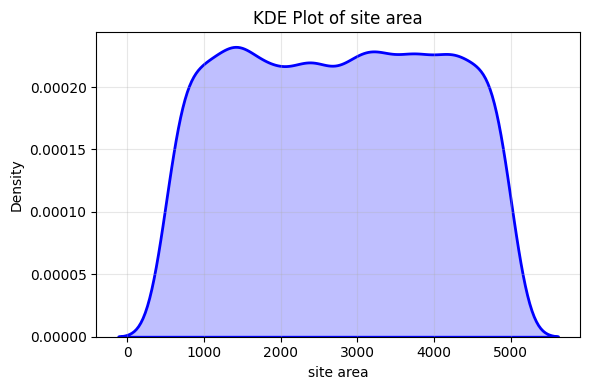

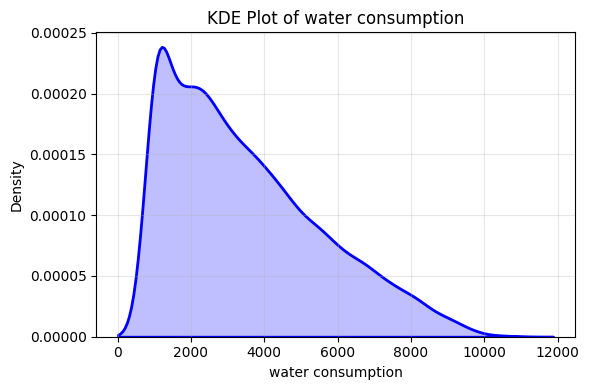

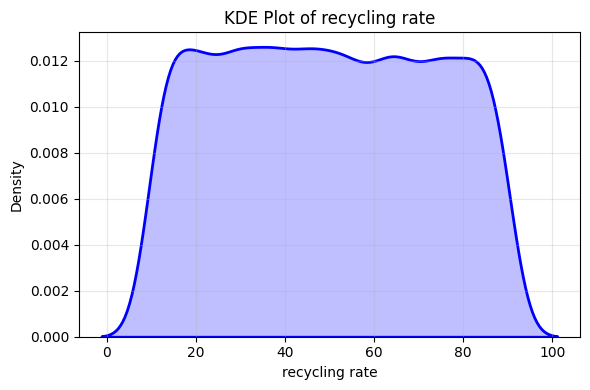

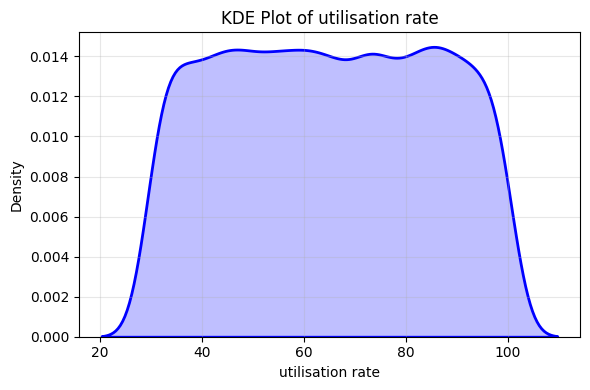

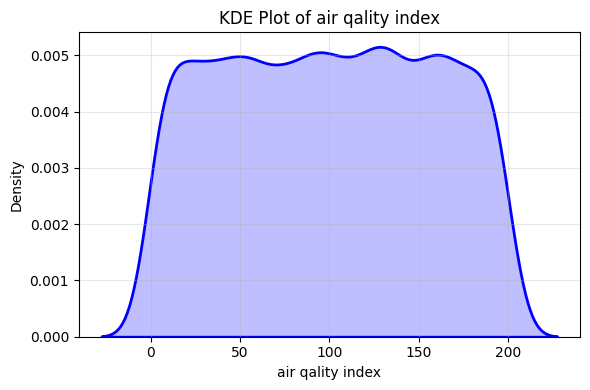

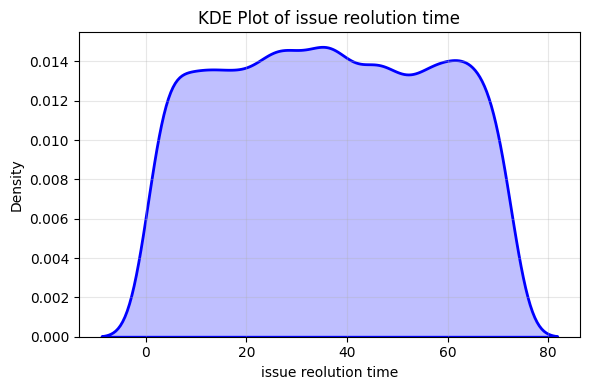

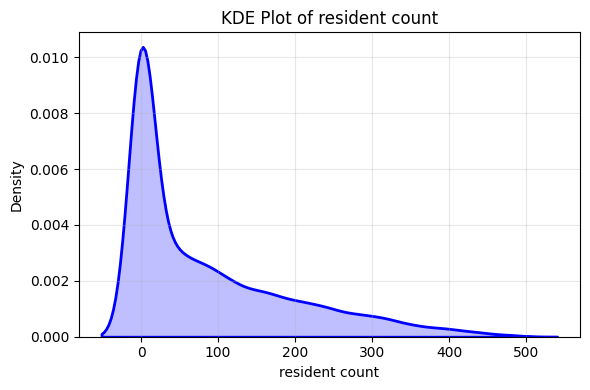

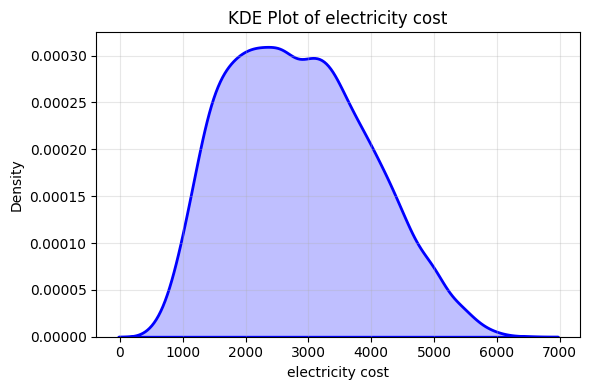

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Select only numeric columns
numeric_cols = electricity_data_original.select_dtypes(include=['number']).columns

# Plot KDE for each numeric column
for col in numeric_cols:
    plt.figure(figsize=(6, 4))
    sns.kdeplot(electricity_data_original[col], fill=True, color='blue', linewidth=2)
    plt.title(f'KDE Plot of {col}')
    plt.xlabel(col)
    plt.ylabel('Density')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()


In [ ]:
electricity_data_original.columns

Index(['site area', 'structure type', 'water consumption', 'recycling rate',
       'utilisation rate', 'air qality index', 'issue reolution time',
       'resident count', 'electricity cost'],
      dtype='object')

# Applying One-Hot Encoding to 'structure type' column

In [ ]:
import pandas as pd

# One-hot encode 'structure type'
electricity_data_encoded = pd.get_dummies(
    electricity_data_original,
    columns=['structure type'],
    drop_first=True  # Avoid dummy variable trap
)


In [ ]:
electricity_data_encoded

,site area,water consumption,recycling rate,utilisation rate,air qality index,issue reolution time,resident count,electricity cost,structure type_Industrial,structure type_Mixed-use,structure type_Residential
0,1360,2519,69,52,188,1,72,1420,False,True,False
1,4272,2324,50,76,165,65,261,3298,False,True,False
2,3592,2701,20,94,198,39,117,3115,False,True,False
3,966,1000,13,60,74,3,35,1575,False,False,True
4,4926,5990,23,65,32,57,185,4301,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...
9995,708,1365,76,77,22,23,0,885,False,False,False
9996,2960,3332,22,72,100,47,54,3081,False,False,True
9997,3942,2427,61,43,48,49,0,3325,False,False,False
9998,3211,4639,72,73,105,55,0,2892,False,False,False


# Doing train test split

In [ ]:
from sklearn.model_selection import train_test_split

# Separate input (X) and output (y)
X = electricity_data_encoded.drop(columns=['electricity cost'])
y = electricity_data_encoded['electricity cost']

# Train-test split (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.2,       # 20% test data
    random_state=42      # For reproducibility
)

# Shapes of splits
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)


X_train shape: (8000, 10)
X_test shape: (2000, 10)
y_train shape: (8000,)
y_test shape: (2000,)


'Electricity_train' as the training dataset .

In [ ]:
import pandas as pd

# Concatenate X_train and y_train
Electricity_train = pd.concat([X_train, y_train], axis=1)

Electricity_train


,site area,water consumption,recycling rate,utilisation rate,air qality index,issue reolution time,resident count,structure type_Industrial,structure type_Mixed-use,structure type_Residential,electricity cost
9254,4903,8208,56,65,68,36,189,False,True,False,3210
1561,2155,1628,89,44,49,24,111,False,True,False,1312
1670,3001,2381,64,73,8,43,263,False,True,False,2410
6087,4595,2524,13,43,29,4,0,False,False,False,3690
6669,4580,5815,71,39,100,39,123,False,True,False,3153
...,...,...,...,...,...,...,...,...,...,...,...
5734,3672,2229,38,93,93,35,250,False,False,True,4177
5191,2561,3650,32,94,199,30,211,False,False,True,3550
5390,1166,1142,13,54,134,30,63,False,False,True,1512
860,1484,1454,70,59,40,64,0,False,False,False,1568


In [ ]:
import pandas as pd

# Concatenate X_train and y_train
Electricity_test = pd.concat([X_test, y_test], axis=1)

Electricity_test


,site area,water consumption,recycling rate,utilisation rate,air qality index,issue reolution time,resident count,structure type_Industrial,structure type_Mixed-use,structure type_Residential,electricity cost
6252,1447,1000,22,69,179,65,0,True,False,False,2027
4684,865,1000,11,97,69,68,78,False,False,True,1744
1731,3131,4507,11,94,35,26,232,False,False,True,4233
4742,1058,1897,36,89,19,57,0,False,False,False,1912
4521,1053,1000,28,79,12,61,99,False,False,True,1757
...,...,...,...,...,...,...,...,...,...,...,...
6412,2858,2950,58,96,162,46,119,False,False,True,3226
8285,4004,2144,29,62,33,40,342,False,False,True,4515
7853,2931,4554,18,60,75,51,94,False,True,False,2311
1095,3652,2120,56,43,53,39,115,False,False,True,3104


# Doing KDE Plot on all the numerical columns in the Electricity_train dataset

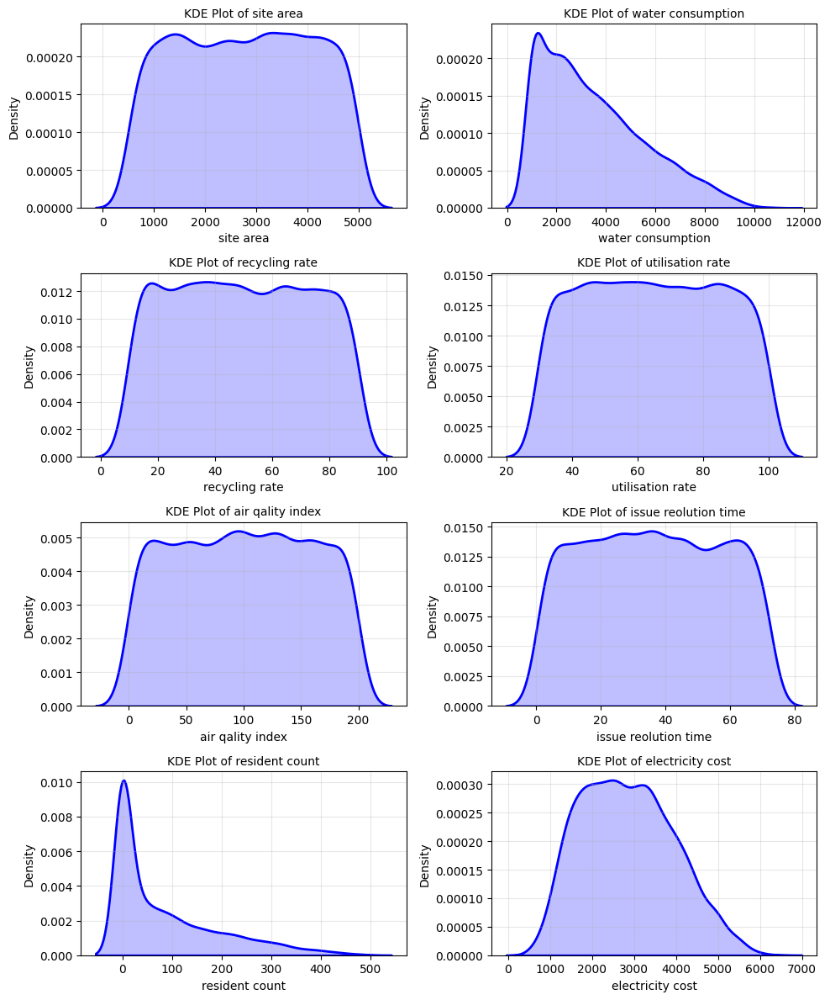

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import math

# Select numeric columns
numeric_cols = Electricity_train.select_dtypes(include=['number']).columns

# Grid size (2 plots per row)
n_cols = 2
n_rows = math.ceil(len(numeric_cols) / n_cols)

# Create subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(10, 3*n_rows))
axes = axes.flatten()

# Loop through columns and plot KDE
for i, col in enumerate(numeric_cols):
    sns.kdeplot(Electricity_train[col], fill=True, color='blue', linewidth=2, ax=axes[i])
    axes[i].set_title(f'KDE Plot of {col}', fontsize=10)
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Density')
    axes[i].grid(True, alpha=0.3)

# Hide any empty subplots if columns < grid size
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


# QQ plot

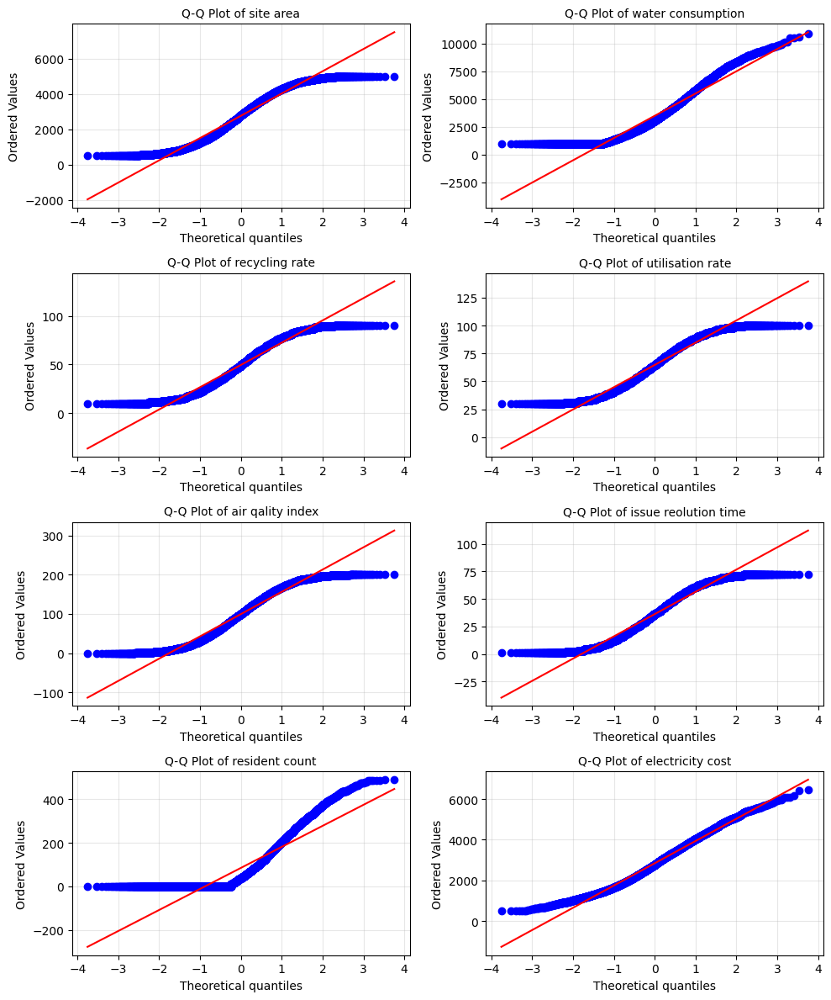

In [ ]:
import matplotlib.pyplot as plt
import scipy.stats as stats
import math

# Select numeric columns
numeric_cols = Electricity_train.select_dtypes(include=['number']).columns

# Grid size (2 plots per row)
n_cols = 2
n_rows = math.ceil(len(numeric_cols) / n_cols)

# Create subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(10, 3*n_rows))
axes = axes.flatten()

# Loop through columns and plot Q-Q plots
for i, col in enumerate(numeric_cols):
    stats.probplot(Electricity_train[col], dist="norm", plot=axes[i])
    axes[i].set_title(f'Q-Q Plot of {col}', fontsize=10)
    axes[i].grid(True, alpha=0.3)

# Hide any empty subplots if columns < grid size
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


# Skewness and Kurtosis

In [ ]:
import pandas as pd
from scipy.stats import skew, kurtosis

# Assuming Electricity_train is already loaded in the environment
# Select numeric columns
numeric_cols = Electricity_train.select_dtypes(include=['number']).columns

# Calculate skewness and kurtosis
stats_df = pd.DataFrame({
    'Skewness': Electricity_train[numeric_cols].apply(lambda x: skew(x.dropna())),
    'Kurtosis': Electricity_train[numeric_cols].apply(lambda x: kurtosis(x.dropna()))  # Fishers definition
})



# Skewness report on all the columns of Electricity_train dataset

In [ ]:

import pandas as pd

# Function to classify skewness
def classify_skewness(s):
    if abs(s) < 0.1:
        return "Approximately Symmetric"
    elif s > 0:
        return "Positively Skewed (Right tail longer)"
    else:
        return "Negatively Skewed (Left tail longer)"

# Calculate skewness for all numeric columns
skewness_values = Electricity_train.skew(numeric_only=True)

# Create DataFrame with classifications
skewness_report = pd.DataFrame({
    'Skewness': skewness_values,
    'Interpretation': skewness_values.apply(classify_skewness)
})

print("📊 Skewness Report for Electricity_train dataset:")
print(skewness_report)


📊 Skewness Report for Electricity_train dataset:
                            Skewness                         Interpretation
site area                  -0.015946                Approximately Symmetric
water consumption           0.765526  Positively Skewed (Right tail longer)
recycling rate              0.021236                Approximately Symmetric
utilisation rate            0.013110                Approximately Symmetric
air qality index           -0.007387                Approximately Symmetric
issue reolution time        0.017824                Approximately Symmetric
resident count              1.318143  Positively Skewed (Right tail longer)
structure type_Industrial   2.639658  Positively Skewed (Right tail longer)
structure type_Mixed-use    1.488610  Positively Skewed (Right tail longer)
structure type_Residential  0.441990  Positively Skewed (Right tail longer)
electricity cost            0.292886  Positively Skewed (Right tail longer)


# Analysis of the kurtosis report on Electricity_train data

In [ ]:
import pandas as pd
from scipy.stats import kurtosis

# Calculate kurtosis for each numeric column
kurtosis_values = Electricity_train[numeric_cols].apply(lambda x: kurtosis(x.dropna(), fisher=False))

# Classify into Mesokurtic, Leptokurtic, or Platykurtic
def classify_kurtosis(k):
    if abs(k - 3) < 0.1:  # Allowing a small tolerance
        return "Mesokurtic (Normal tailed thickness)"
    elif k > 3:
        return "Leptokurtic (Heavy tails, more outliers than normal)"
    else:
        return "Platykurtic (Light tails, fewer outliers than normal)"

kurtosis_df = pd.DataFrame({
    'Kurtosis': kurtosis_values,  # Pearson definition
    'Tail Type': kurtosis_values.apply(classify_kurtosis)
})

kurtosis_df


,Kurtosis,Tail Type
site area,1.803148,"Platykurtic (Light tails, fewer outliers than ..."
water consumption,2.801866,"Platykurtic (Light tails, fewer outliers than ..."
recycling rate,1.797639,"Platykurtic (Light tails, fewer outliers than ..."
utilisation rate,1.815009,"Platykurtic (Light tails, fewer outliers than ..."
air qality index,1.816111,"Platykurtic (Light tails, fewer outliers than ..."
issue reolution time,1.824748,"Platykurtic (Light tails, fewer outliers than ..."
resident count,3.946984,"Leptokurtic (Heavy tails, more outliers than n..."
electricity cost,2.400780,"Platykurtic (Light tails, fewer outliers than ..."


# Mean , Median , Mode for all the variables in Electricity_train data . This is relatable to skewness of the data

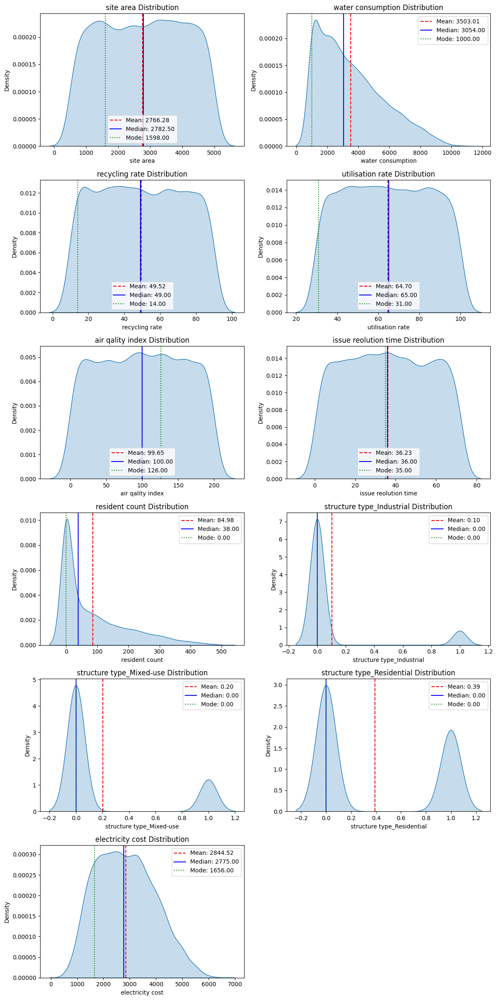

In [ ]:
# Calculate mean, median, and mode for each column
mean_vals = Electricity_train.mean()
median_vals = Electricity_train.median()
mode_vals = Electricity_train.mode().iloc[0]

# Number of columns in dataset
num_cols = len(Electricity_train.columns)

# Create KDE plots in a 2-per-row layout
plt.figure(figsize=(12, (num_cols // 2 + num_cols % 2) * 4))

for i, col in enumerate(Electricity_train.columns, 1):
    plt.subplot((num_cols + 1) // 2, 2, i)  # two plots per row
    sns.kdeplot(Electricity_train[col], fill=True)
    plt.axvline(mean_vals[col], color='red', linestyle='--', label=f"Mean: {mean_vals[col]:.2f}")
    plt.axvline(median_vals[col], color='blue', linestyle='-', label=f"Median: {median_vals[col]:.2f}")
    plt.axvline(mode_vals[col], color='green', linestyle=':', label=f"Mode: {mode_vals[col]:.2f}")
    plt.title(f"{col} Distribution")
    plt.legend()

plt.tight_layout()
plt.show()


# Computing 5th percentile , Q1 , Q3 and 95 percentile  of the columns of Electricity_train dataset . This is relatable to the Kurtosis .

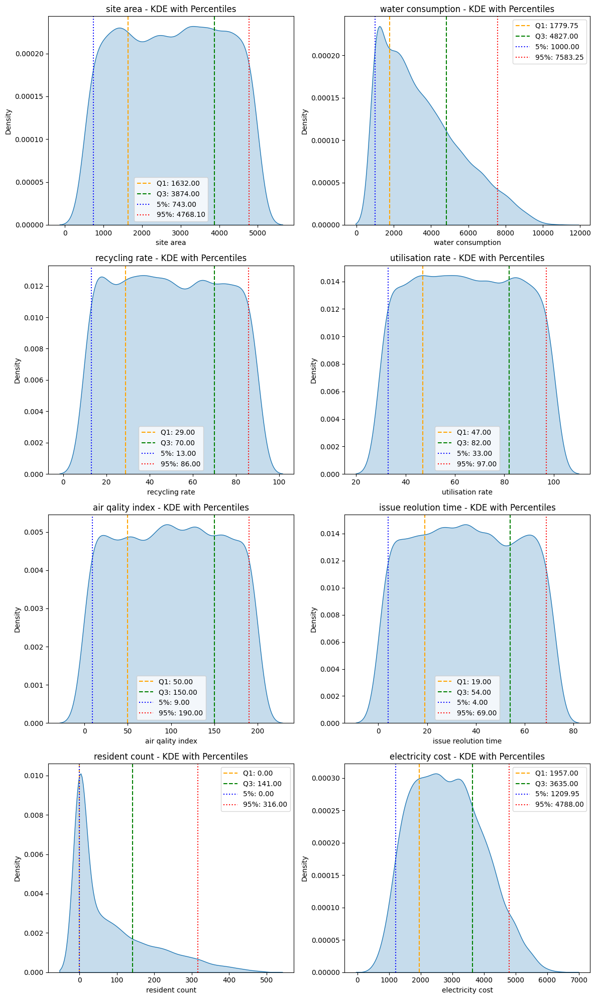

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math

# Ensure numeric columns only
numeric_cols = Electricity_train.select_dtypes(include=['number']).columns

# Define subplot grid
n_cols = 2
n_rows = math.ceil(len(numeric_cols) / n_cols)

fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(12, 5 * n_rows))
axes = axes.flatten()  # Flatten for easy indexing

# Loop through each numeric column
for i, col in enumerate(numeric_cols):
    data = Electricity_train[col].dropna()

    # Calculate values
    q1 = data.quantile(0.25)
    q3 = data.quantile(0.75)
    p5 = data.quantile(0.05)
    p95 = data.quantile(0.95)

    # KDE plot
    sns.kdeplot(data, ax=axes[i], fill=True)
    axes[i].set_title(f'{col} - KDE with Percentiles', fontsize=12)

    # Mark percentiles
    axes[i].axvline(q1, color='orange', linestyle='--', label=f'Q1: {q1:.2f}')
    axes[i].axvline(q3, color='green', linestyle='--', label=f'Q3: {q3:.2f}')
    axes[i].axvline(p5, color='blue', linestyle=':', label=f'5%: {p5:.2f}')
    axes[i].axvline(p95, color='red', linestyle=':', label=f'95%: {p95:.2f}')

    axes[i].legend()

# Remove empty subplots if any
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


# Checking Correlation among the variables variable

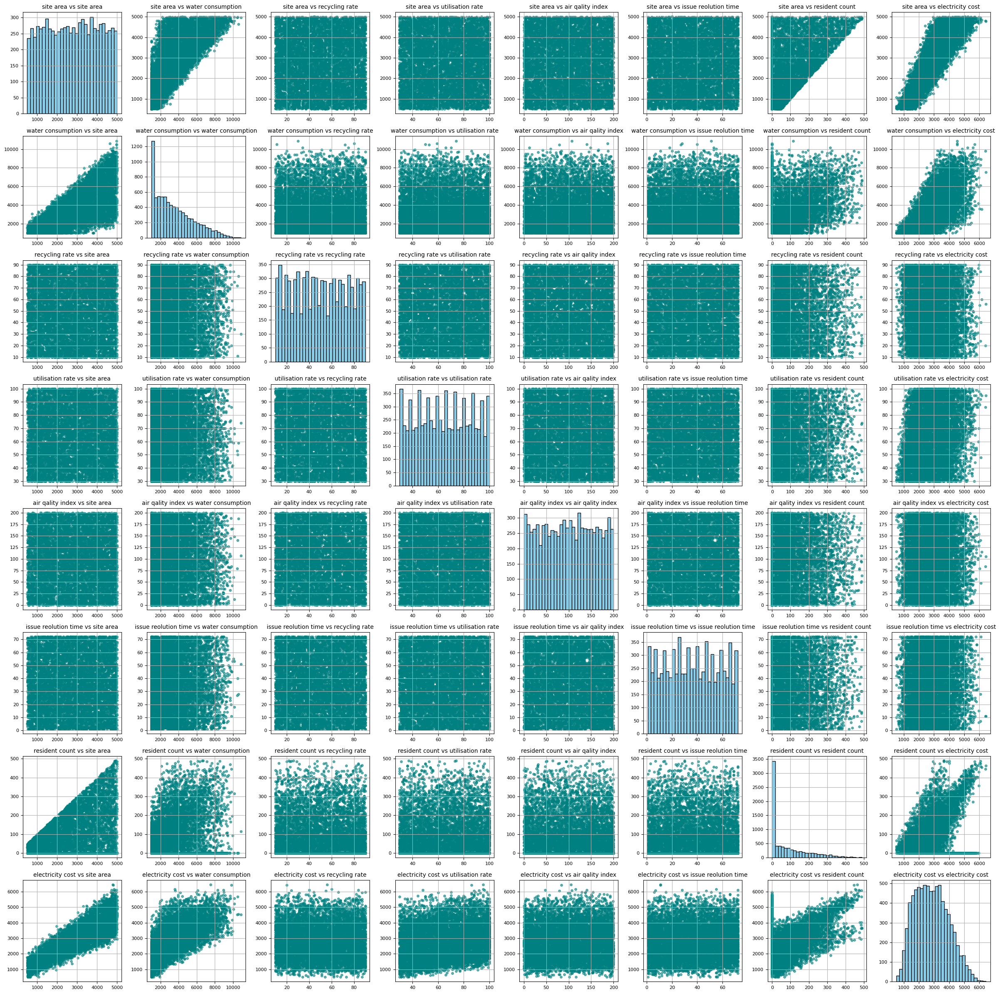

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Select only numeric columns from Electricity_train
df = Electricity_train.select_dtypes(include='number')

cols = df.columns
n = len(cols)

fig, axes = plt.subplots(n, n, figsize=(3*n, 3*n))

for i in range(n):
    for j in range(n):
        ax = axes[i, j]
        if i == j:
            # Diagonal: Histogram
            ax.hist(df[cols[i]], bins=30, color='skyblue', edgecolor='black')
            ax.set_title(f"{cols[i]} vs {cols[j]}", fontsize=10)
        else:
            # Off-diagonal: Scatterplot
            ax.scatter(df[cols[j]], df[cols[i]], alpha=0.6, s=15, color='teal')
            ax.set_title(f"{cols[i]} vs {cols[j]}", fontsize=10)
        ax.tick_params(axis='both', labelsize=8)
        ax.grid(True)

plt.tight_layout()
plt.show()



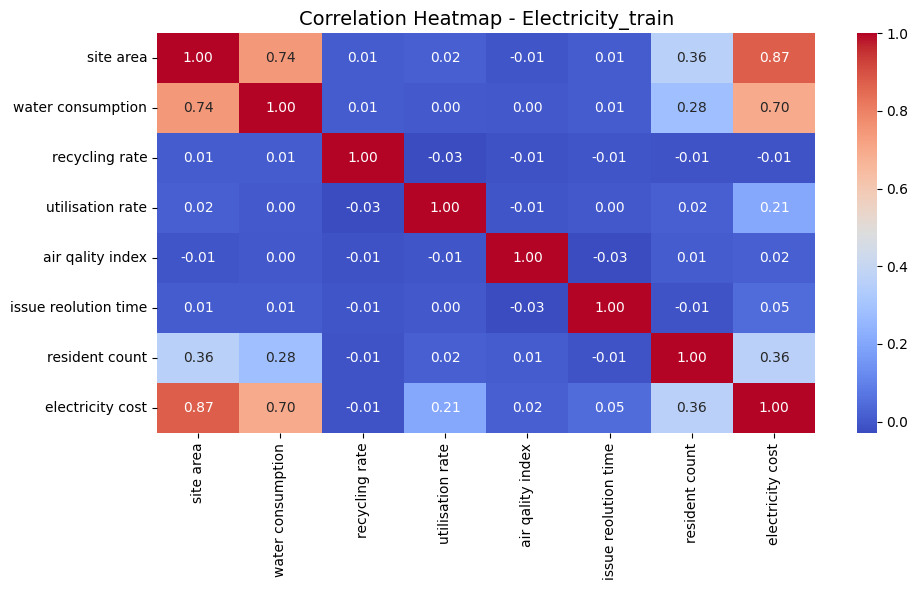

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select only numeric columns
numeric_cols = Electricity_train.select_dtypes(include='number')

# Compute correlation matrix
corr_matrix = numeric_cols.corr()

# Plot heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Heatmap - Electricity_train", fontsize=14)
plt.tight_layout()
plt.show()


# Applying Tukey's Fences method to check the existence of outlier variable wise .

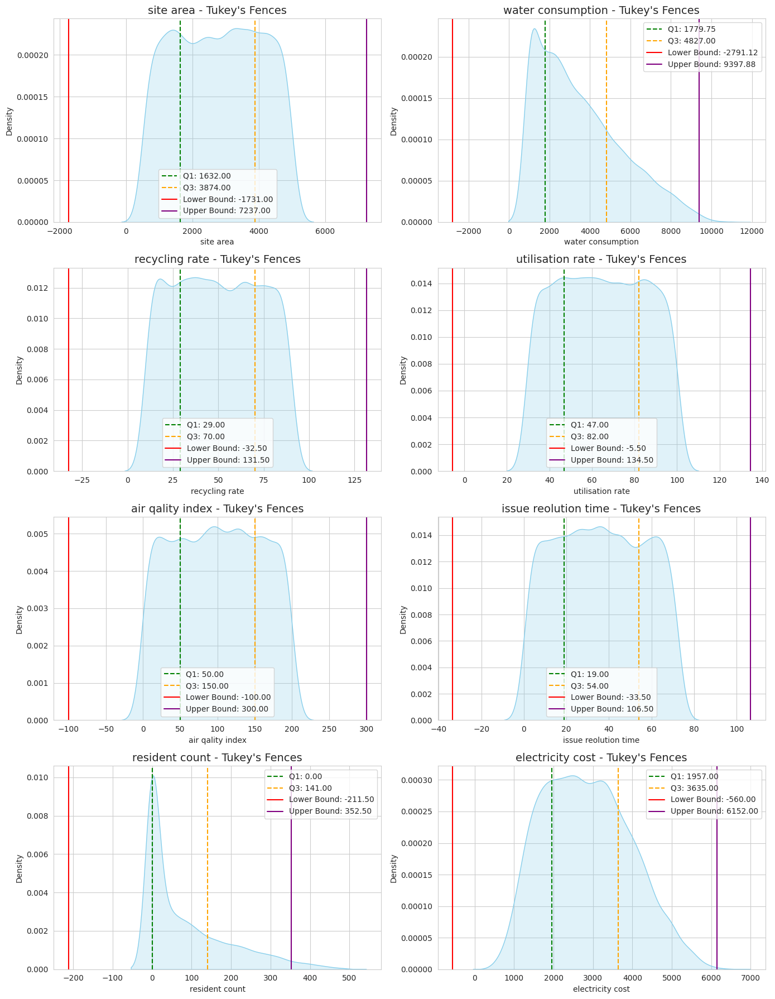

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Copy to avoid altering original
df = Electricity_train.copy()

# Select numeric columns only
num_cols = df.select_dtypes(include=['number']).columns

# Set plot style
sns.set_style("whitegrid")

# Create subplots
fig, axes = plt.subplots(nrows=len(num_cols)//2 + len(num_cols)%2, ncols=2, figsize=(14, 4*len(num_cols)//2 + 2))
axes = axes.flatten()

# Loop through each numeric column
for i, col in enumerate(num_cols):
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Plot KDE
    sns.kdeplot(df[col], ax=axes[i], fill=True, color='skyblue')
    axes[i].set_title(f"{col} - Tukey's Fences", fontsize=14)

    # Mark Q1, Q3, and bounds
    axes[i].axvline(Q1, color='green', linestyle='--', label=f"Q1: {Q1:.2f}")
    axes[i].axvline(Q3, color='orange', linestyle='--', label=f"Q3: {Q3:.2f}")
    axes[i].axvline(lower_bound, color='red', linestyle='-', label=f"Lower Bound: {lower_bound:.2f}")
    axes[i].axvline(upper_bound, color='purple', linestyle='-', label=f"Upper Bound: {upper_bound:.2f}")

    axes[i].legend()

# Remove extra subplots if any
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


# ANOMALY DETECTION

In [ ]:
from sklearn.ensemble import IsolationForest
import numpy as np

# Assuming Electricity_train is your DataFrame and you have numeric columns
X = Electricity_train.select_dtypes(include=[np.number])

iso_forest = IsolationForest(contamination=0.05, random_state=42)
iso_forest.fit(X)

preds = iso_forest.predict(X)
anomaly_indices = np.where(preds == -1)[0]

print("Anomaly indices:", anomaly_indices)


Anomaly indices: [  46   73   85  100  165  167  170  171  225  231  234  254  294  299
  333  343  365  370  435  436  480  489  500  503  522  608  672  711
  730  772  849  890  902  918  927  928  931  933  967  988  995  999
 1003 1029 1041 1043 1052 1053 1060 1066 1072 1107 1136 1169 1172 1177
 1202 1222 1253 1267 1294 1329 1364 1382 1397 1405 1408 1413 1416 1436
 1438 1472 1479 1510 1528 1554 1597 1668 1669 1713 1736 1746 1789 1802
 1803 1807 1819 1854 1890 1895 1906 1915 1922 1949 1962 1972 2045 2048
 2056 2071 2100 2187 2195 2202 2262 2298 2316 2326 2328 2342 2372 2406
 2425 2432 2456 2488 2570 2576 2587 2677 2689 2713 2718 2726 2739 2777
 2804 2809 2816 2821 2823 2833 2855 2875 2877 2898 2957 2982 2996 2997
 3020 3069 3071 3104 3107 3119 3125 3128 3150 3162 3176 3183 3189 3246
 3257 3261 3283 3288 3289 3302 3349 3361 3397 3400 3414 3460 3492 3496
 3508 3524 3544 3549 3550 3552 3583 3588 3595 3618 3632 3686 3696 3756
 3759 3760 3770 3831 3871 3916 3940 3941 3950 3956 3963 3981

In [ ]:
len(anomaly_indices)

400

In [ ]:
# anomaly_indices is a numpy array or list of indices to remove

# Remove anomaly rows by dropping them based on index

Electricity_train_no_anomaly = Electricity_train.drop(Electricity_train.index[anomaly_indices]).reset_index(drop=True)


# Check the new shape
print("Shape before removing anomalies:", Electricity_train.shape)
print("Shape after removing anomalies:", Electricity_train_no_anomaly.shape)


Shape before removing anomalies: (8000, 11)
Shape after removing anomalies: (7600, 11)


In [ ]:
Electricity_train_no_anomaly

,site area,water consumption,recycling rate,utilisation rate,air qality index,issue reolution time,resident count,structure type_Industrial,structure type_Mixed-use,structure type_Residential,electricity cost
0,4903,8208,56,65,68,36,189,False,True,False,3210
1,2155,1628,89,44,49,24,111,False,True,False,1312
2,3001,2381,64,73,8,43,263,False,True,False,2410
3,4595,2524,13,43,29,4,0,False,False,False,3690
4,4580,5815,71,39,100,39,123,False,True,False,3153
...,...,...,...,...,...,...,...,...,...,...,...
7595,3672,2229,38,93,93,35,250,False,False,True,4177
7596,2561,3650,32,94,199,30,211,False,False,True,3550
7597,1166,1142,13,54,134,30,63,False,False,True,1512
7598,1484,1454,70,59,40,64,0,False,False,False,1568


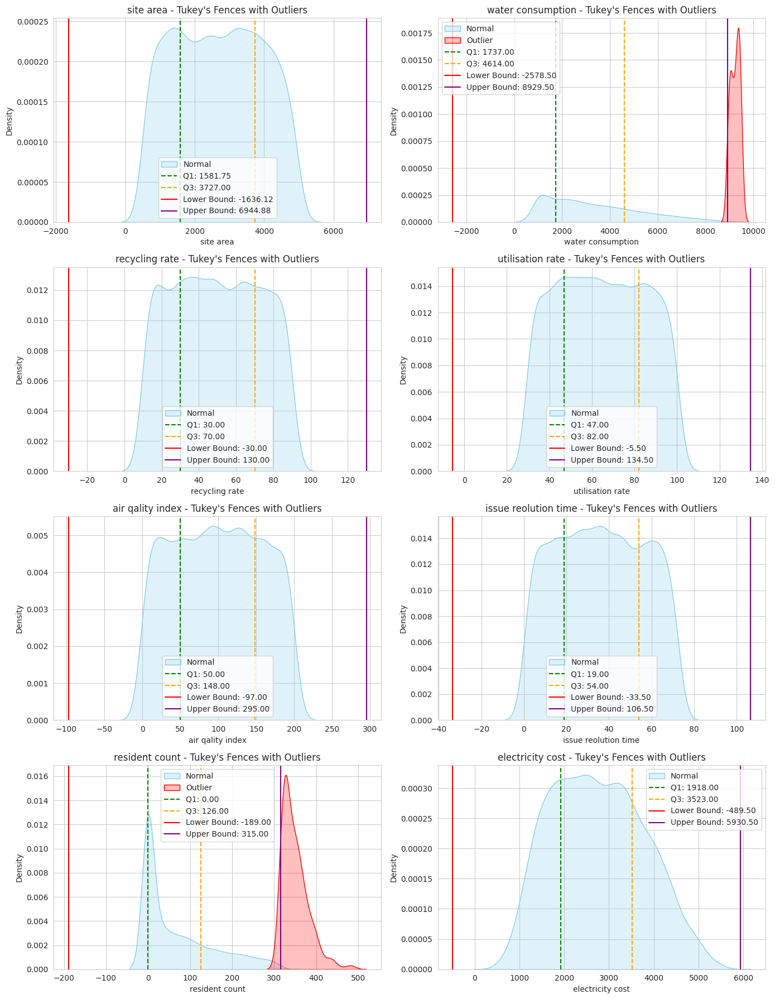

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

df = Electricity_train_no_anomaly.copy()

num_cols = df.select_dtypes(include=['number']).columns

sns.set_style("whitegrid")

fig, axes = plt.subplots(nrows=len(num_cols)//2 + len(num_cols)%2, ncols=2, figsize=(14, 4*len(num_cols)//2 + 2))
axes = axes.flatten()

for i, col in enumerate(num_cols):
    data = df[col]
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Label points
    labels = data.apply(lambda x: 'Outlier' if (x < lower_bound) or (x > upper_bound) else 'Normal')

    # Plot KDE for Normal points
    sns.kdeplot(data[labels == 'Normal'], ax=axes[i], fill=True, color='skyblue', label='Normal')
    # Plot KDE for Outliers if any
    if (labels == 'Outlier').sum() > 0:
        sns.kdeplot(data[labels == 'Outlier'], ax=axes[i], fill=True, color='red', label='Outlier')

    axes[i].set_title(f"{col} - Tukey's Fences with Outliers")

    # Draw vertical lines for Q1, Q3, and fences
    axes[i].axvline(Q1, color='green', linestyle='--', label=f"Q1: {Q1:.2f}")
    axes[i].axvline(Q3, color='orange', linestyle='--', label=f"Q3: {Q3:.2f}")
    axes[i].axvline(lower_bound, color='red', linestyle='-', label=f"Lower Bound: {lower_bound:.2f}")
    axes[i].axvline(upper_bound, color='purple', linestyle='-', label=f"Upper Bound: {upper_bound:.2f}")

    axes[i].legend()

for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


In [ ]:
Electricity_train_no_anomaly.columns


Index(['site area', 'water consumption', 'recycling rate', 'utilisation rate',
       'air qality index', 'issue reolution time', 'resident count',
       'structure type_Industrial', 'structure type_Mixed-use',
       'structure type_Residential', 'electricity cost'],
      dtype='object')

In [ ]:
Electricity_train_no_anomaly_winsorized = Electricity_train_no_anomaly.copy()

cols_to_winsorize = ['resident count', 'water consumption']

for col in cols_to_winsorize:
    data = Electricity_train_no_anomaly_winsorized[col]

    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    Electricity_train_no_anomaly_winsorized[col] = data.clip(lower=lower_bound, upper=upper_bound)


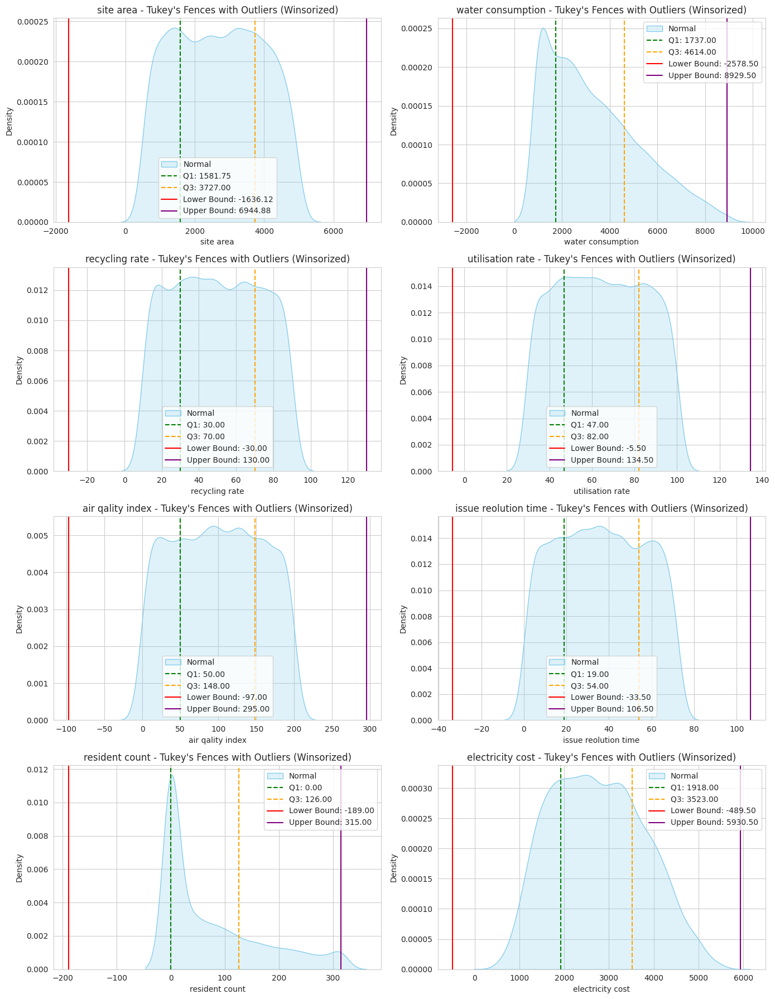

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

df = Electricity_train_no_anomaly_winsorized.copy()  # changed here

num_cols = df.select_dtypes(include=['number']).columns

sns.set_style("whitegrid")

fig, axes = plt.subplots(nrows=len(num_cols)//2 + len(num_cols)%2, ncols=2, figsize=(14, 4*len(num_cols)//2 + 2))
axes = axes.flatten()

for i, col in enumerate(num_cols):
    data = df[col]
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Label points
    labels = data.apply(lambda x: 'Outlier' if (x < lower_bound) or (x > upper_bound) else 'Normal')

    # Plot KDE for Normal points
    sns.kdeplot(data[labels == 'Normal'], ax=axes[i], fill=True, color='skyblue', label='Normal')
    # Plot KDE for Outliers if any
    if (labels == 'Outlier').sum() > 0:
        sns.kdeplot(data[labels == 'Outlier'], ax=axes[i], fill=True, color='red', label='Outlier')

    axes[i].set_title(f"{col} - Tukey's Fences with Outliers (Winsorized)")

    # Draw vertical lines for Q1, Q3, and fences
    axes[i].axvline(Q1, color='green', linestyle='--', label=f"Q1: {Q1:.2f}")
    axes[i].axvline(Q3, color='orange', linestyle='--', label=f"Q3: {Q3:.2f}")
    axes[i].axvline(lower_bound, color='red', linestyle='-', label=f"Lower Bound: {lower_bound:.2f}")
    axes[i].axvline(upper_bound, color='purple', linestyle='-', label=f"Upper Bound: {upper_bound:.2f}")

    axes[i].legend()

for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


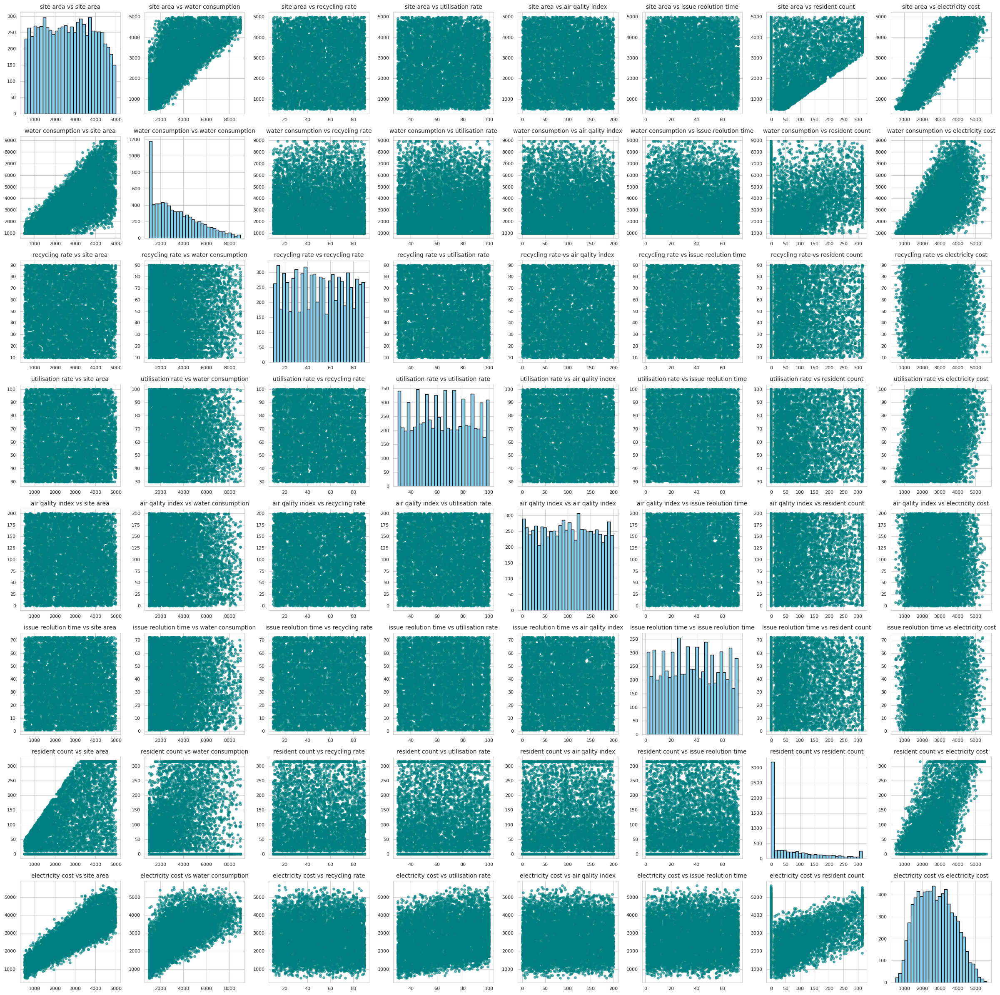

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Select only numeric columns from winsorized, anomaly-cleaned data
df = Electricity_train_no_anomaly_winsorized.select_dtypes(include='number')

cols = df.columns
n = len(cols)

fig, axes = plt.subplots(n, n, figsize=(3*n, 3*n))

for i in range(n):
    for j in range(n):
        ax = axes[i, j]
        if i == j:
            # Diagonal: Histogram
            ax.hist(df[cols[i]], bins=30, color='skyblue', edgecolor='black')
            ax.set_title(f"{cols[i]} vs {cols[j]}", fontsize=10)
        else:
            # Off-diagonal: Scatterplot
            ax.scatter(df[cols[j]], df[cols[i]], alpha=0.6, s=15, color='teal')
            ax.set_title(f"{cols[i]} vs {cols[j]}", fontsize=10)
        ax.tick_params(axis='both', labelsize=8)
        ax.grid(True)

plt.tight_layout()
plt.show()


In [ ]:
Electricity_train_no_anomaly_winsorized.columns

Index(['site area', 'water consumption', 'recycling rate', 'utilisation rate',
       'air qality index', 'issue reolution time', 'resident count',
       'structure type_Industrial', 'structure type_Mixed-use',
       'structure type_Residential', 'electricity cost'],
      dtype='object')

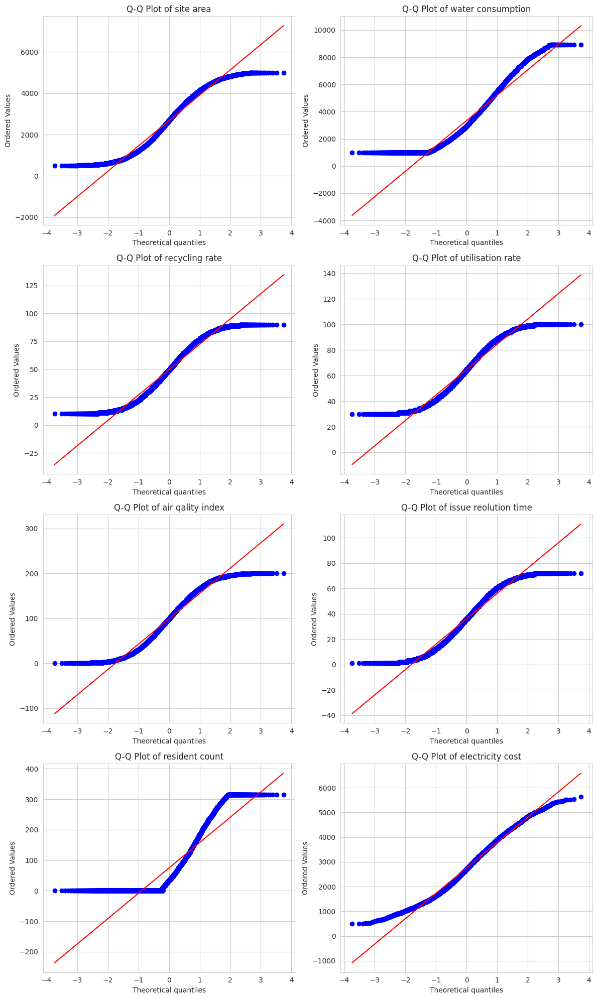

In [ ]:
import matplotlib.pyplot as plt
import scipy.stats as stats

df = Electricity_train_no_anomaly_winsorized.select_dtypes(include='number')  # it contains only numeric data
num_cols = df.columns

n = len(num_cols)
rows = n // 2 + n % 2  # 2 plots per row

plt.figure(figsize=(12, 5 * rows))

for i, col in enumerate(num_cols, 1):
    plt.subplot(rows, 2, i)
    stats.probplot(df[col], dist="norm", plot=plt)
    plt.title(f"Q-Q Plot of {col}")
    plt.grid(True)

plt.tight_layout()
plt.show()


In [ ]:
# Select numeric columns
numeric_cols = Electricity_train_no_anomaly_winsorized.select_dtypes(include='number')

# Calculate skewness for each numeric column
skewness_values = numeric_cols.skew()

# Display skewness
print(skewness_values)


site area               0.026146
water consumption       0.718002
recycling rate          0.019875
utilisation rate        0.020162
air qality index        0.002883
issue reolution time    0.022166
resident count          1.136608
electricity cost        0.209070
dtype: float64


# Apply log transformation on Water consumption and resident count

In [ ]:
import numpy as np

# Log transform skewed columns
Electricity_train_no_anomaly_winsorized['water consumption_log'] = np.log1p(Electricity_train_no_anomaly_winsorized['water consumption'])
Electricity_train_no_anomaly_winsorized['resident count_log'] = np.log1p(Electricity_train_no_anomaly_winsorized['resident count'])


In [ ]:
Electricity_train_no_anomaly_winsorized

,site area,water consumption,recycling rate,utilisation rate,air qality index,issue reolution time,resident count,structure type_Industrial,structure type_Mixed-use,structure type_Residential,electricity cost,water consumption_log,resident count_log
0,4903,8208.0,56,65,68,36,189,False,True,False,3210,9.012986,5.247024
1,2155,1628.0,89,44,49,24,111,False,True,False,1312,7.395722,4.718499
2,3001,2381.0,64,73,8,43,263,False,True,False,2410,7.775696,5.575949
3,4595,2524.0,13,43,29,4,0,False,False,False,3690,7.833996,0.000000
4,4580,5815.0,71,39,100,39,123,False,True,False,3153,8.668368,4.820282
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7595,3672,2229.0,38,93,93,35,250,False,False,True,4177,7.709757,5.525453
7596,2561,3650.0,32,94,199,30,211,False,False,True,3550,8.202756,5.356586
7597,1166,1142.0,13,54,134,30,63,False,False,True,1512,7.041412,4.158883
7598,1484,1454.0,70,59,40,64,0,False,False,False,1568,7.282761,0.000000


# Removing the column

In [ ]:
Electricity_train_no_anomaly_winsorized.drop(columns=['water consumption', 'resident count'], inplace=True)


In [ ]:
Electricity_train_no_anomaly_winsorized

,site area,recycling rate,utilisation rate,air qality index,issue reolution time,structure type_Industrial,structure type_Mixed-use,structure type_Residential,electricity cost,water consumption_log,resident count_log
0,4903,56,65,68,36,False,True,False,3210,9.012986,5.247024
1,2155,89,44,49,24,False,True,False,1312,7.395722,4.718499
2,3001,64,73,8,43,False,True,False,2410,7.775696,5.575949
3,4595,13,43,29,4,False,False,False,3690,7.833996,0.000000
4,4580,71,39,100,39,False,True,False,3153,8.668368,4.820282
...,...,...,...,...,...,...,...,...,...,...,...
7595,3672,38,93,93,35,False,False,True,4177,7.709757,5.525453
7596,2561,32,94,199,30,False,False,True,3550,8.202756,5.356586
7597,1166,13,54,134,30,False,False,True,1512,7.041412,4.158883
7598,1484,70,59,40,64,False,False,False,1568,7.282761,0.000000


# Applying VIF to check Multicollinearity

In [ ]:
import pandas as pd
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Prepare data
df = Electricity_train_no_anomaly_winsorized.copy()

# Define predictors (exclude output column)
X = df.drop(columns=['electricity cost'])

# Select only numeric predictors (important for VIF)
X = X.select_dtypes(include=['number'])

# Add constant column for VIF calculation (optional, but recommended)
X['Intercept'] = 1

# Calculate VIF for each predictor
vif_data = pd.DataFrame()
vif_data['feature'] = X.columns
vif_data['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Drop intercept row (not a real predictor)
vif_data = vif_data[vif_data['feature'] != 'Intercept']

print(vif_data.sort_values(by='VIF', ascending=False))


                 feature       VIF
0              site area  2.407650
5  water consumption_log  2.403087
6     resident count_log  1.010954
3       air qality index  1.002541
1         recycling rate  1.002277
4   issue reolution time  1.001730
2       utilisation rate  1.001220


In [ ]:
cleaned_trained_data = Electricity_train_no_anomaly_winsorized.copy()


In [ ]:
# Assuming cleaned_trained_data is your DataFrame
X_train_cleaned = cleaned_trained_data.drop(columns=['electricity cost'])
y_train_cleaned = cleaned_trained_data['electricity cost']


In [ ]:
import numpy as np

# Apply log1p (log(1 + x)) to handle zeros safely
X_test['water consumption_log'] = np.log1p(X_test['water consumption'])
X_test['resident count_log'] = np.log1p(X_test['resident count'])


In [ ]:
X_test.drop(columns=['water consumption', 'resident count'], inplace=True)

In [ ]:
X_test

,site area,recycling rate,utilisation rate,air qality index,issue reolution time,structure type_Industrial,structure type_Mixed-use,structure type_Residential,water consumption_log,resident count_log
6252,1447,22,69,179,65,True,False,False,6.908755,0.000000
4684,865,11,97,69,68,False,False,True,6.908755,4.369448
1731,3131,11,94,35,26,False,False,True,8.413609,5.451038
4742,1058,36,89,19,57,False,False,False,7.548556,0.000000
4521,1053,28,79,12,61,False,False,True,6.908755,4.605170
...,...,...,...,...,...,...,...,...,...,...
6412,2858,58,96,162,46,False,False,True,7.989899,4.787492
8285,4004,29,62,33,40,False,False,True,7.670895,5.837730
7853,2931,18,60,75,51,False,True,False,8.423981,4.553877
1095,3652,56,43,53,39,False,False,True,7.659643,4.753590


In [ ]:
X_train_cleaned.columns

Index(['site area', 'recycling rate', 'utilisation rate', 'air qality index',
       'issue reolution time', 'structure type_Industrial',
       'structure type_Mixed-use', 'structure type_Residential',
       'water consumption_log', 'resident count_log'],
      dtype='object')

In [ ]:
X_test.columns

Index(['site area', 'recycling rate', 'utilisation rate', 'air qality index',
       'issue reolution time', 'structure type_Industrial',
       'structure type_Mixed-use', 'structure type_Residential',
       'water consumption_log', 'resident count_log'],
      dtype='object')

# Applying Min-Max Normalization on recycling rate ,utilisation rate and air quality index

In [ ]:
# Assuming pandas is imported and X_train_cleaned and X_test are your DataFrames

min_max_dict = {
    'recycling rate': (0, 100),
    'utilisation rate': (0, 100),
    'air qality index': (0, 500)
}

for col, (min_val, max_val) in min_max_dict.items():
    # Apply min-max scaling on training set
    X_train_cleaned[col + '_min_max'] = (X_train_cleaned[col] - min_val) / (max_val - min_val)

    # Apply same scaling on test set
    X_test[col + '_min_max'] = (X_test[col] - min_val) / (max_val - min_val)

# Optionally, if you want to drop original columns after scaling
# X_train_cleaned.drop(columns=min_max_dict.keys(), inplace=True)
# X_test.drop(columns=min_max_dict.keys(), inplace=True)


In [ ]:
X_train_cleaned.drop(columns=['recycling rate', 'utilisation rate','air qality index'], inplace=True)

In [ ]:
X_test.drop(columns=['recycling rate', 'utilisation rate','air qality index'], inplace=True)

# Applying Standard Scaling

In [ ]:
from sklearn.preprocessing import StandardScaler

# Columns to exclude (already min-max scaled)
exclude_cols = ['recycling rate', 'utilisation rate', 'air qality index']

# Select columns for standard scaling
cols_to_scale = [col for col in X_train_cleaned.columns if col not in exclude_cols]

# Initialize scaler
scaler = StandardScaler()

# Fit scaler on training data columns and transform
X_train_cleaned_scaled = scaler.fit_transform(X_train_cleaned[cols_to_scale])

# Transform test data using the same scaler
X_test_scaled = scaler.transform(X_test[cols_to_scale])

# Add scaled columns back to the dataframes with new column names
for i, col in enumerate(cols_to_scale):
    X_train_cleaned[col + '_std_scaled'] = X_train_cleaned_scaled[:, i]
    X_test[col + '_std_scaled'] = X_test_scaled[:, i]


In [ ]:
X_test.columns

Index(['site area', 'issue reolution time', 'structure type_Industrial',
       'structure type_Mixed-use', 'structure type_Residential',
       'water consumption_log', 'resident count_log', 'recycling rate_min_max',
       'utilisation rate_min_max', 'air qality index_min_max',
       'site area_std_scaled', 'issue reolution time_std_scaled',
       'structure type_Industrial_std_scaled',
       'structure type_Mixed-use_std_scaled',
       'structure type_Residential_std_scaled',
       'water consumption_log_std_scaled', 'resident count_log_std_scaled',
       'recycling rate_min_max_std_scaled',
       'utilisation rate_min_max_std_scaled',
       'air qality index_min_max_std_scaled'],
      dtype='object')

In [ ]:
cols_to_scale

['site area',
 'issue reolution time',
 'structure type_Industrial',
 'structure type_Mixed-use',
 'structure type_Residential',
 'water consumption_log',
 'resident count_log',
 'recycling rate_min_max',
 'utilisation rate_min_max',
 'air qality index_min_max']

In [ ]:
cols_to_remove = [
    'structure type_Industrial_std_scaled',
    'structure type_Mixed-use_std_scaled',
    'structure type_Residential_std_scaled',
    'site area',
    'issue reolution time',

    'water consumption_log',
    'resident count_log',
    'recycling rate_min_max_std_scaled',
    'utilisation rate_min_max_std_scaled',
    'air qality index_min_max_std_scaled'
]

# Remove columns if they exist in the DataFrame (to avoid errors)
X_train_cleaned = X_train_cleaned.drop(columns=[col for col in cols_to_remove if col in X_train_cleaned.columns])
X_test = X_test.drop(columns=[col for col in cols_to_remove if col in X_test.columns])


In [ ]:
X_train_cleaned

,structure type_Industrial,structure type_Mixed-use,structure type_Residential,recycling rate_min_max,utilisation rate_min_max,air qality index_min_max,site area_std_scaled,issue reolution time_std_scaled,water consumption_log_std_scaled,resident count_log_std_scaled
0,False,True,False,0.56,0.65,0.136,1.778688,-0.004999,1.740420,1.104293
1,False,True,False,0.89,0.44,0.098,-0.418090,-0.592547,-0.873513,0.878627
2,False,True,False,0.64,0.73,0.016,0.258211,0.337737,-0.259373,1.244734
3,False,False,False,0.13,0.43,0.058,1.532470,-1.571794,-0.165144,-1.136038
4,False,True,False,0.71,0.39,0.200,1.520479,0.141888,1.183425,0.922086
...,...,...,...,...,...,...,...,...,...,...
7595,False,False,True,0.38,0.93,0.186,0.794615,-0.053962,-0.365948,1.223174
7596,False,False,True,0.32,0.94,0.398,-0.093529,-0.298773,0.430871,1.151072
7597,False,False,True,0.13,0.54,0.268,-1.208706,-0.298773,-1.446173,0.639687
7598,False,False,False,0.70,0.59,0.080,-0.954494,1.365946,-1.056088,-1.136038


In [ ]:
X_test

,structure type_Industrial,structure type_Mixed-use,structure type_Residential,recycling rate_min_max,utilisation rate_min_max,air qality index_min_max,site area_std_scaled,issue reolution time_std_scaled,water consumption_log_std_scaled,resident count_log_std_scaled
6252,True,False,False,0.22,0.69,0.358,-0.984072,1.414908,-1.660582,-1.136038
4684,False,False,True,0.11,0.97,0.138,-1.449328,1.561795,-1.660582,0.729592
1731,False,False,True,0.11,0.94,0.070,0.362134,-0.494623,0.771666,1.191401
4742,False,False,False,0.36,0.89,0.038,-1.295042,1.023210,-0.626492,-1.136038
4521,False,False,True,0.28,0.79,0.024,-1.299039,1.219059,-1.660582,0.830239
...,...,...,...,...,...,...,...,...,...,...
6412,False,False,True,0.58,0.96,0.324,0.143895,0.484624,0.086837,0.908085
8285,False,False,True,0.29,0.62,0.066,1.060019,0.190850,-0.428760,1.356507
7853,False,True,False,0.18,0.60,0.150,0.202252,0.729436,0.788429,0.808338
1095,False,False,True,0.56,0.43,0.106,0.778627,0.141888,-0.446946,0.893610


In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

# 1. Create the model
model = LinearRegression()

# 2. Fit the model on training data
model.fit(X_train_cleaned, y_train_cleaned)

# 3. Predict on training data
y_train_pred = model.predict(X_train_cleaned)

# 4. Predict on test data
y_test_pred = model.predict(X_test)

# 5. Calculate R^2 scores (accuracy)
train_r2 = r2_score(y_train_cleaned, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)

print(f"Train R^2 score: {train_r2:.4f}")
print(f"Test R^2 score: {test_r2:.4f}")


Train R^2 score: 0.9155
Test R^2 score: 0.9158


In [ ]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import r2_score

# Define the model
dt = DecisionTreeRegressor(random_state=42)

# Define hyperparameter grid for tuning
param_grid = {
    'max_depth': [3, 5, 10, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': [None , 'sqrt', 'log2']  # Note: 'auto' may give warning for DecisionTreeRegressor
}

# Setup GridSearchCV
grid_search = GridSearchCV(estimator=dt, param_grid=param_grid,
                           cv=5, n_jobs=-1, scoring='r2', verbose=1)

# Fit on training data
grid_search.fit(X_train_cleaned, y_train_cleaned)

# Best model from grid search
best_dt = grid_search.best_estimator_

# Predict train and test
y_train_pred = best_dt.predict(X_train_cleaned)
y_test_pred = best_dt.predict(X_test)

# Calculate R2 scores
train_r2 = r2_score(y_train_cleaned, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)

print("Best hyperparameters:", grid_search.best_params_)
print(f"Train R^2 score: {train_r2:.4f}")
print(f"Test R^2 score: {test_r2:.4f}")


Fitting 5 folds for each of 135 candidates, totalling 675 fits
Best hyperparameters: {'max_depth': 10, 'max_features': None, 'min_samples_leaf': 4, 'min_samples_split': 10}
Train R^2 score: 0.9647
Test R^2 score: 0.9427


In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import r2_score
from scipy.stats import randint

# Define the model
rf = RandomForestRegressor(random_state=42)

# Parameter distribution for RandomizedSearchCV
param_dist = {
    'n_estimators': randint(100, 300),            # random int between 100 and 300
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': randint(2, 11),          # random int between 2 and 10
    'min_samples_leaf': randint(1, 5),            # random int between 1 and 4
    'max_features': ['sqrt', 'log2', None]
}

# Setup RandomizedSearchCV
random_search = RandomizedSearchCV(estimator=rf, param_distributions=param_dist,
                                   n_iter=50,  # number of parameter settings sampled
                                   cv=5,
                                   n_jobs=-1,
                                   scoring='r2',
                                   verbose=1,
                                   random_state=42)

# Fit random search on training data
random_search.fit(X_train_cleaned, y_train_cleaned)

# Best model
best_rf = random_search.best_estimator_

# Predict on train and test sets
y_train_pred = best_rf.predict(X_train_cleaned)
y_test_pred = best_rf.predict(X_test)

# Calculate R^2 scores
train_r2 = r2_score(y_train_cleaned, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)

print("Best hyperparameters:", random_search.best_params_)
print(f"Train R^2 score: {train_r2:.4f}")
print(f"Test R^2 score: {test_r2:.4f}")


Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best hyperparameters: {'max_depth': 20, 'max_features': None, 'min_samples_leaf': 4, 'min_samples_split': 8, 'n_estimators': 289}
Train R^2 score: 0.9826
Test R^2 score: 0.9589


In [ ]:
from xgboost import XGBRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import r2_score
from scipy.stats import randint, uniform

# Define the model
xgb = XGBRegressor(random_state=42, objective='reg:squarederror')

# Parameter distributions for random search
param_dist = {
    'n_estimators': randint(100, 500),
    'max_depth': randint(3, 15),
    'learning_rate': uniform(0.01, 0.3),  # from 0.01 to 0.31
    'subsample': uniform(0.6, 0.4),        # from 0.6 to 1.0
    'colsample_bytree': uniform(0.6, 0.4), # from 0.6 to 1.0
    'min_child_weight': randint(1, 10),
    'gamma': uniform(0, 5)
}

# Setup RandomizedSearchCV
random_search = RandomizedSearchCV(
    estimator=xgb,
    param_distributions=param_dist,
    n_iter=50,  # number of random combinations to try
    cv=5,
    scoring='r2',
    verbose=1,
    n_jobs=-1,
    random_state=42
)

# Fit on training data
random_search.fit(X_train_cleaned, y_train_cleaned)

# Best model
best_xgb = random_search.best_estimator_

# Predictions
y_train_pred = best_xgb.predict(X_train_cleaned)
y_test_pred = best_xgb.predict(X_test)

# R2 scores
train_r2 = r2_score(y_train_cleaned, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)

print("Best hyperparameters:", random_search.best_params_)
print(f"Train R^2 score: {train_r2:.4f}")
print(f"Test R^2 score: {test_r2:.4f}")


Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best hyperparameters: {'colsample_bytree': np.float64(0.8307615538505436), 'gamma': np.float64(2.4625884690943196), 'learning_rate': np.float64(0.06857289633941334), 'max_depth': 5, 'min_child_weight': 4, 'n_estimators': 134, 'subsample': np.float64(0.9074216057225236)}
Train R^2 score: 0.9700
Test R^2 score: 0.9623


In [ ]:
import lightgbm as lgb
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import r2_score
from scipy.stats import randint, uniform

# Define the model
lgbm = lgb.LGBMRegressor(random_state=42)

# Parameter distributions for RandomizedSearchCV
param_dist = {
    'num_leaves': randint(20, 150),
    'max_depth': randint(3, 15),
    'learning_rate': uniform(0.01, 0.3),
    'n_estimators': randint(100, 500),
    'min_child_samples': randint(5, 50),
    'subsample': uniform(0.6, 0.4),           # 0.6 to 1.0
    'colsample_bytree': uniform(0.6, 0.4),    # 0.6 to 1.0
    'reg_alpha': uniform(0, 1),                # L1 regularization
    'reg_lambda': uniform(0, 1)                # L2 regularization
}

# Setup RandomizedSearchCV
random_search = RandomizedSearchCV(
    estimator=lgbm,
    param_distributions=param_dist,
    n_iter=50,            # number of parameter settings sampled
    scoring='r2',
    cv=5,
    verbose=0,
    n_jobs=-1,
    random_state=42
)

# Fit on training data
random_search.fit(X_train_cleaned, y_train_cleaned)

# Best model
best_lgbm = random_search.best_estimator_

# Predictions
y_train_pred = best_lgbm.predict(X_train_cleaned)
y_test_pred = best_lgbm.predict(X_test)

# R2 scores
train_r2 = r2_score(y_train_cleaned, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)

print("Best hyperparameters:", random_search.best_params_)
print(f"Train R^2 score: {train_r2:.4f}")
print(f"Test R^2 score: {test_r2:.4f}")


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000457 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1191
[LightGBM] [Info] Number of data points in the train set: 7600, number of used features: 10
[LightGBM] [Info] Start training from score 2755.227237
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

## Model Performance Report

| Model              | Train R² Score | Test R² Score |
|--------------------|----------------|---------------|
| Linear Regression  | 0.9155         | 0.9158        |
| Decision Tree      | 0.9647         | 0.9427        |
| Random Forest      | **0.9826**     | **0.9589**    |
| XGBoost            | 0.9700         | **0.9623**    |
| LightGBM           | 0.9663         | 0.9618        |

### Best Model:
Based on the **highest Test R² Score**, **XGBoost** (0.9623) is the best performing model, closely followed by LightGBM (0.9618) and Random Forest (0.9589).  
While Random Forest has the highest Train R² Score, XGBoost generalizes slightly better on unseen data.
